<a href="https://colab.research.google.com/github/VVUBYA/LAYER-WISE-BACKWARD-PROPAGATION-AND-DEEP-TRANSFER-LEARNING-FOR-TOMATO-DISEASE-DETECTION/blob/main/tomato_leaf_disease.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
!pip install comet_ml

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 634.0/634.0 kB 10.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 20.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 5.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 264.6/264.6 kB 20.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 137.9/137.9 kB 12.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.3/54.3 kB 5.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 514.7/514.7 kB 23.8 MB/s eta 0:00:00
  Attempting uninstall: websocket-client
    Found existing installation: websocket-client 1.7.0
    Uninstalling websocket-client-1.7.0:
      Successfully uninstalled websocket-client-1.7.0
  Attempting uninstall: python-box
    Found existing installation: python-box 7.1.1
    Uninstalling python-box-7.1.1:
      Successfully uninstalled python-box-7.1.1


In [3]:
from comet_ml import Experiment
from comet_ml.integration.pytorch import log_model

experiment = Experiment(
  api_key="lHcJRGKeb3PiB6nGkOjJJnuCN",
  project_name="general",
  workspace="vvubya"
)

COMET WARNING: As you are running in a Jupyter environment, you will need to call `experiment.end()` when finished to ensure all metrics and code are logged before exiting.
COMET INFO: Couldn't find a Git repository in '/content' nor in any parent directory. Set `COMET_GIT_DIRECTORY` if your Git Repository is elsewhere.
COMET INFO: Experiment is live on comet.com https://www.comet.com/vvubya/general/12200a8cc14743f3aa1b4eb2635a8804



In [4]:
!pip install rarfile


In [5]:
from google.colab import drive
drive.mount('/content/drive')



Mounted at /content/drive


In [6]:
import numpy as np
import tensorflow as tf  # For tf.data
import matplotlib.pyplot as plt
import keras
from keras import layers
from keras.applications import EfficientNetB0

In [8]:
from google.colab import drive
import os
import rarfile

# Mount Google Drive
drive.mount('/content/drive')

# Define paths
dataset_rar_path = "/content/drive/My Drive/tomato.rar"
extracted_dir_path = "/content/tomato"

# Create directory for extraction
os.makedirs(extracted_dir_path, exist_ok=True)

# Open and extract the dataset
with rarfile.RarFile(dataset_rar_path, 'r') as rf:
    rf.extractall(extracted_dir_path)

# Define directories
train_dir = os.path.join(extracted_dir_path, "tomato", "train")
valid_dir = os.path.join(extracted_dir_path, "tomato", "valid")

# Define image size and batch size
IMG_SIZE = 224
BATCH_SIZE = 64

# Data augmentation and preprocessing
train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    validation_split=0.2
)

valid_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)

# Load and preprocess training dataset
train_dataset = train_datagen.flow_from_directory(
    train_dir,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='training'
)

# Load and preprocess validation dataset
valid_dataset = valid_datagen.flow_from_directory(
    valid_dir,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='training'  # Assuming you want to use a portion of validation set for validation
)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Found 8000 images belonging to 10 classes.
Found 1000 images belonging to 10 classes.


DISPLAYING IMAGES

Displaying 5 images from each class in the train directory:


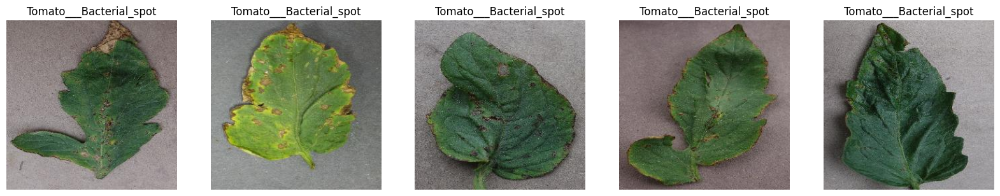

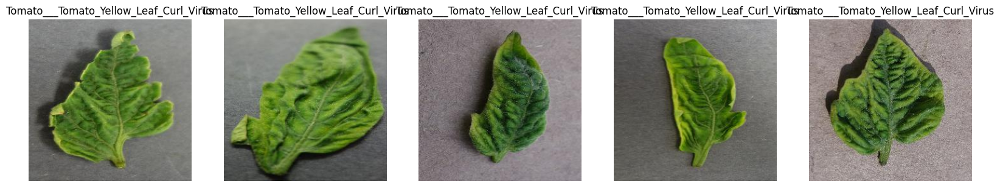

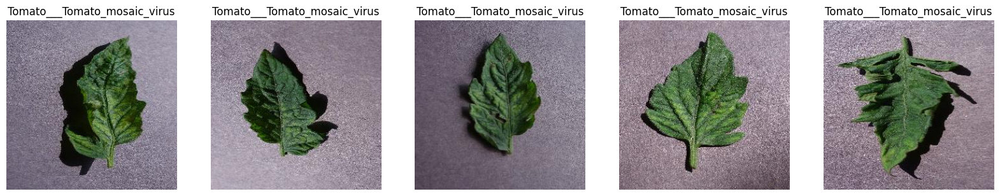

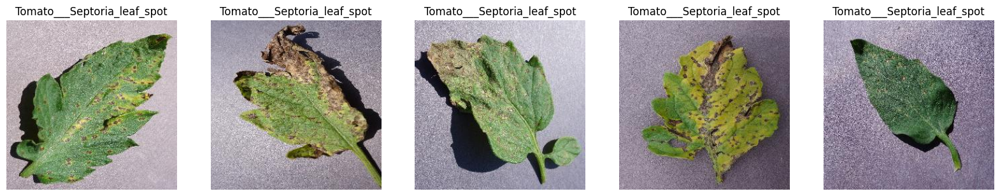

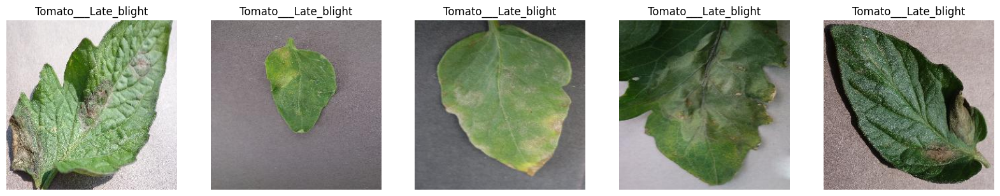

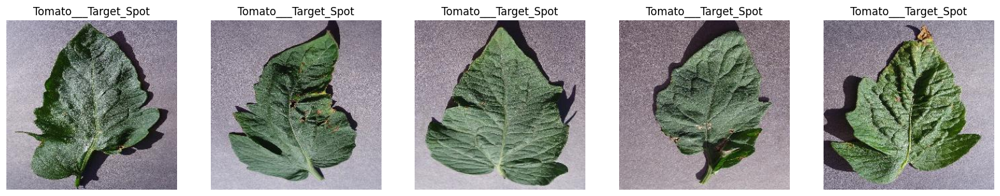

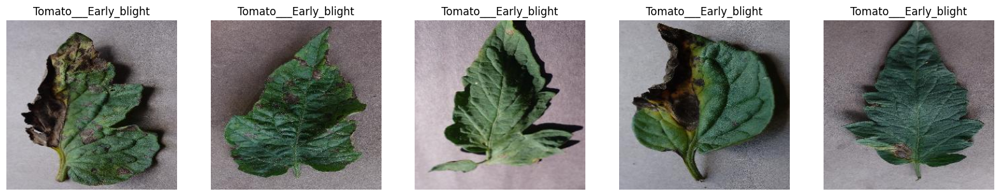

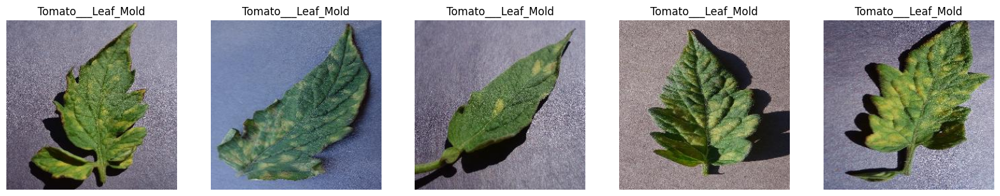

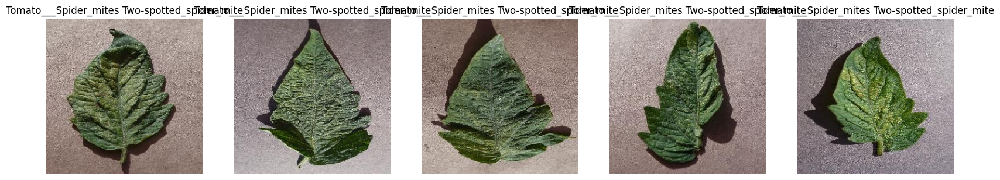

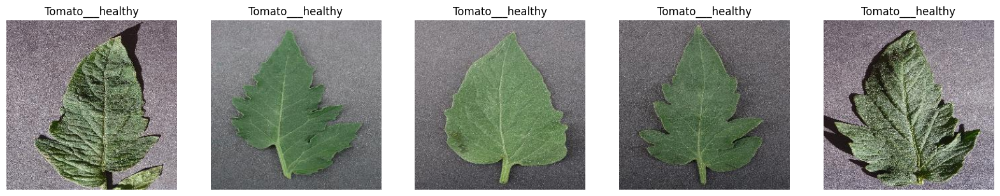

Displaying 5 images from each class in the validation directory:


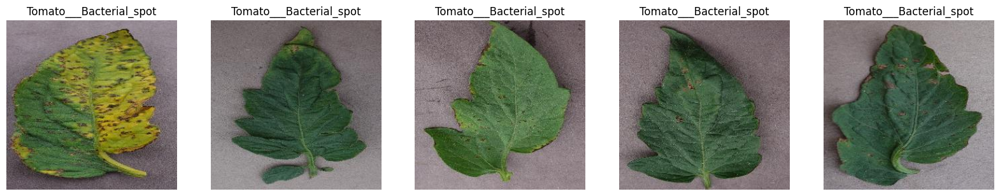

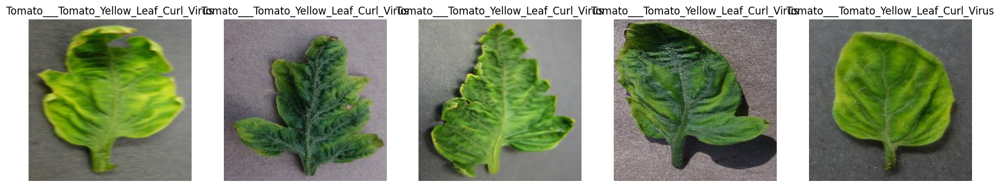

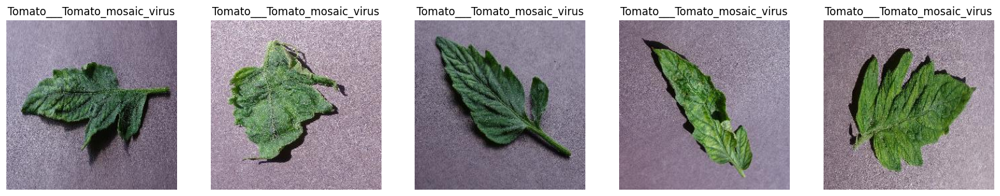

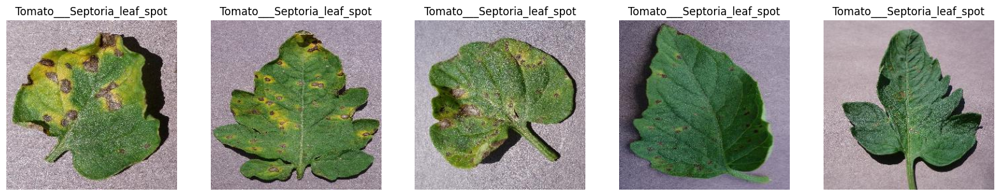

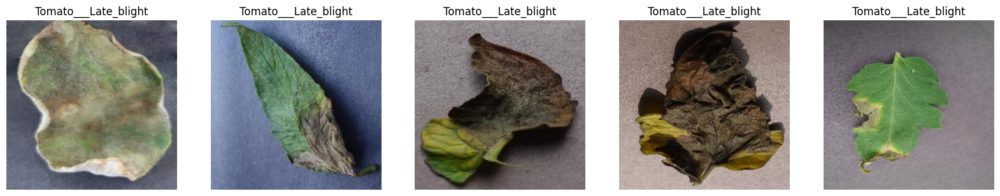

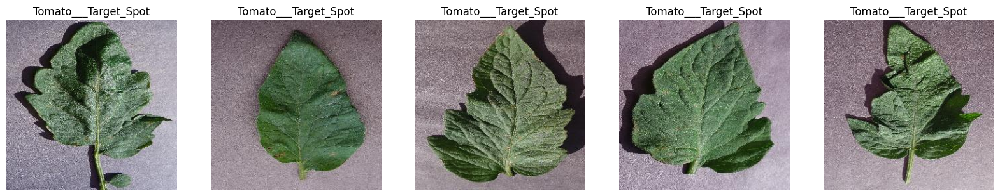

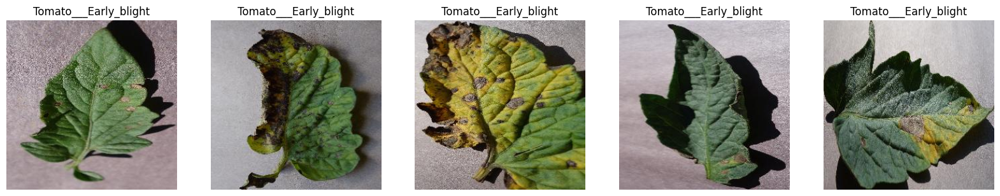

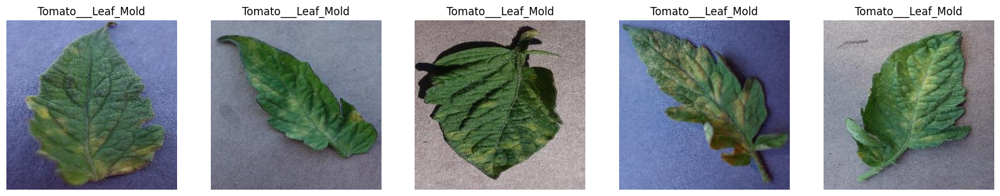

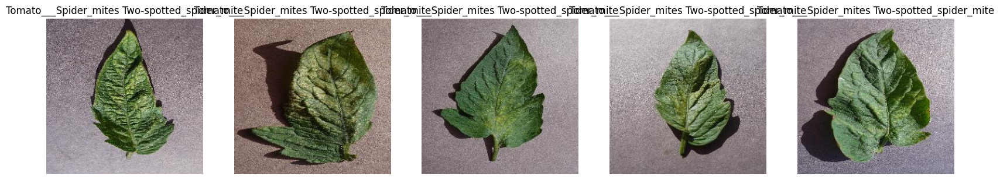

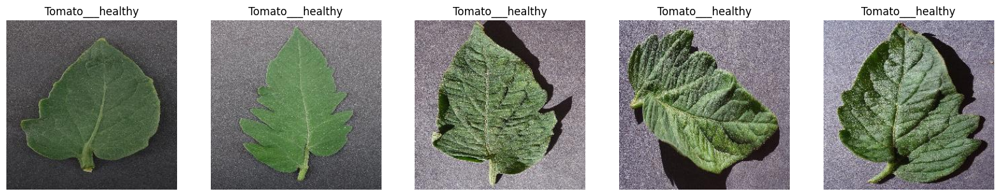

In [ ]:
import os
import matplotlib.pyplot as plt
from PIL import Image

def display_images(dataset_dir, num_images_per_class):
    # Get list of class folders
    class_folders = os.listdir(dataset_dir)

    # Plot the images
    for class_folder in class_folders:
        # Get list of image files in the class folder
        class_folder_path = os.path.join(dataset_dir, class_folder)
        image_files = os.listdir(class_folder_path)[:num_images_per_class]

        # Plot the images for this class
        fig, axes = plt.subplots(1, num_images_per_class, figsize=(num_images_per_class * 4, 4))
        for i, image_file in enumerate(image_files):
            # Open and display the image
            image_path = os.path.join(class_folder_path, image_file)
            image = Image.open(image_path)
            axes[i].imshow(image)
            axes[i].set_title(class_folder)  # Set class name as the title
            axes[i].axis('off')

        plt.show()

# Display 5 images from each class in the train directory
print("Displaying 5 images from each class in the train directory:")
display_images(train_dir, 5)

# Display 5 images from each class in the validation directory
print("Displaying 5 images from each class in the validation directory:")
display_images(valid_dir, 5)




In [9]:
from comet_ml import Experiment
from keras.applications import EfficientNetB0
from keras.models import Sequential
from keras.layers import Dense, GlobalAveragePooling2D
from keras.optimizers import Adam
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt


# Step 4: Log hyperparameters
hyper_params = {
   "epochs": 3,
   "optimizer": "Adam",
   "learning_rate": 0.01,
}
experiment.log_parameters(hyper_params)

# Step 5: Define your model
NUM_CLASSES = 10
model = Sequential([
    EfficientNetB0(
        include_top=True,
        weights=None,
        classes=NUM_CLASSES,
        input_shape=(IMG_SIZE, IMG_SIZE, 3),
    )
])

# Compile the model
model.compile(optimizer=Adam(learning_rate=hyper_params["learning_rate"]), loss='categorical_crossentropy', metrics=['accuracy'])

# Print model summary
model.summary()

# Step 6: Train your model
history = model.fit(train_dataset, epochs=hyper_params["epochs"], validation_data=valid_dataset)

# Log training metrics to Comet
for epoch in range(hyper_params["epochs"]):
    experiment.log_metric("train_loss", history.history['loss'][epoch], epoch=epoch)
    experiment.log_metric("train_accuracy", history.history['accuracy'][epoch], epoch=epoch)
    experiment.log_metric("val_loss", history.history['val_loss'][epoch], epoch=epoch)
    experiment.log_metric("val_accuracy", history.history['val_accuracy'][epoch], epoch=epoch)

# Compute predictions and true labels
true_labels = []
predictions = []

cm = confusion_matrix(true_labels, predictions)
experiment.log_confusion_matrix(matrix=cm, title='Confusion Matrix')

# Compute and log 3D histogram
plt.figure(figsize=(8, 6))
plt.hist2d(predictions, true_labels, bins=10, cmap=plt.cm.Blues)
plt.colorbar()
plt.title('3D Histogram')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
experiment.log_histogram_3d(plt)

# Save the model
model.save("model2.h5")




Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetb0 (Functional  (None, 10)                4062381   
 )                                                               
                                                                 
Total params: 4062381 (15.50 MB)
Trainable params: 4020358 (15.34 MB)
Non-trainable params: 42023 (164.16 KB)
_________________________________________________________________


COMET INFO: Ignoring automatic log_parameter('verbose') because 'keras:verbose' is in COMET_LOGGING_PARAMETERS_IGNORE


Epoch 1/3
125/125 [==============================] - 1534s 12s/step - loss: 3.0455 - accuracy: 0.2037 - val_loss: 2.8659 - val_accuracy: 0.1000
Epoch 2/3
125/125 [==============================] - 1560s 12s/step - loss: 1.5464 - accuracy: 0.4401 - val_loss: 8.9386 - val_accuracy: 0.1000
Epoch 3/3
125/125 [==============================] - 1510s 12s/step - loss: 1.0070 - accuracy: 0.6520 - val_loss: 8.2658 - val_accuracy: 0.1000


NameError: name 'predictions' is not defined

TypeError: 'module' object is not iterable

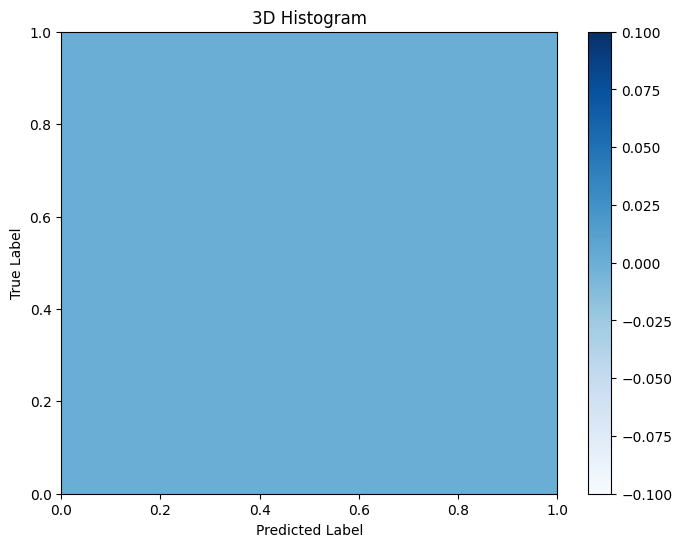

In [10]:
true_labels = []
predictions = []

cm = confusion_matrix(true_labels, predictions)
experiment.log_confusion_matrix(matrix=cm, title='Confusion Matrix')

# Compute and log 3D histogram
plt.figure(figsize=(8, 6))
plt.hist2d(predictions, true_labels, bins=10, cmap=plt.cm.Blues)
plt.colorbar()
plt.title('3D Histogram')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
experiment.log_histogram_3d(plt)

# Save the model
model.save("model2.h5")

In [ ]:
# Compute predictions and true labels
for data, labels in valid_dataset:
    predictions = model.predict(data)
    true_labels.extend(labels.argmax(axis=1))
    predictions = predictions.argmax(axis=1)

cm = confusion_matrix(true_labels, predictions)
experiment.log_confusion_matrix(matrix=cm, title='Confusion Matrix')

# Compute and log 3D histogram
plt.figure(figsize=(8, 6))
plt.hist2d(predictions, true_labels, bins=10, cmap=plt.cm.Blues)
plt.colorbar()
plt.title('3D Histogram')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
experiment.log_histogram_3d(plt)

# Save the model
model.save("model2.h5")

2/2 [==============================] - 3s 1s/step


In [ ]:
from comet_ml import Experiment

experiment = Experiment(
  api_key="lHcJRGKeb3PiB6nGkOjJJnuCN",
  project_name="general",
  workspace="vvubya"
)
experiment.log_model("tomato.h5", "/content/tomato.h5")


COMET WARNING: As you are running in a Jupyter environment, you will need to call `experiment.end()` when finished to ensure all metrics and code are logged before exiting.
COMET INFO: Couldn't find a Git repository in '/content' nor in any parent directory. Set `COMET_GIT_DIRECTORY` if your Git Repository is elsewhere.
COMET INFO: Experiment is live on comet.com https://www.comet.com/vvubya/general/1da8954b628e42308a5bba08f2cd9fe7



{'web': 'https://www.comet.com/api/asset/download?assetId=ef4a7af2f2974939ac953b85bbd2586e&experimentKey=1da8954b628e42308a5bba08f2cd9fe7',
 'api': 'https://www.comet.com/api/rest/v2/experiment/asset/get-asset?assetId=ef4a7af2f2974939ac953b85bbd2586e&experimentKey=1da8954b628e42308a5bba08f2cd9fe7',
 'assetId': 'ef4a7af2f2974939ac953b85bbd2586e'}

In [ ]:
from comet_ml import API

api = API("lHcJRGKeb3PiB6nGkOjJJnuCN")

#get the Model object
model = api.get_model(workspace="vvubya", model_name="tomato.h5")

# Download a Registry Model:
model.download("1.0.0", expand=True)

COMET INFO: Remote Model 'vvubya/tomato.h5:1.0.0' download has been started asynchronously.
COMET INFO: Still downloading 1 file(s), remaining 47.03 MB/47.03 MB
COMET INFO: Remote Model 'vvubya/tomato.h5:1.0.0' has been successfully downloaded.
COMET INFO: Downloaded asset files is in '/tmp/tmpecnnl5q0' folder.
